In [187]:
data = pd.read_csv('donovoanmitchell1725.csv')
data = data.rename(columns={'Unnamed: 7':'W/L'})
data = data.drop('Unnamed: 5', axis=1)
data['+/-'] = pd.to_numeric(data['+/-'], errors='coerce').fillna(0).astype(int)


data['W/L'] = data['W/L'].str.split(' ')

data['Result'] = data['W/L'].apply(

    lambda x: x[0]

).apply(pd.Series)

data['Point Differential'] = data['W/L'].apply(

    lambda x: x[1]

).apply(pd.Series)


data['Result']
data['Point Differential'] = data['Point Differential'].str.strip('(')
data['Point Differential'] = data['Point Differential'].str.strip(')')
data['Point Differential'] = data['Point Differential'].astype('int64')

data['Date']= pd.to_datetime(data['Date'])
data['Age'] = data['Age'].apply(
    lambda x: int(x.split('-')[0]) + int(x.split('-')[1]) / 365
)
data = data.drop('W/L', axis=1)

# Convert 'MP' to decimal while handling 'Inactive'
def convert_to_decimal(mp):
    if mp == "Inactive" or mp == "Did Not Dress" or mp == "Did Not Play":
        return 0
    minutes, seconds = map(int, mp.split(':'))
    return minutes + seconds / 60


def inactive(mp):
    if mp == "Inactive" or mp == "Did Not Dress" or mp == "Did Not Play":
        return 0
    return mp



data['MP'] = data['MP'].apply(convert_to_decimal)
data['GS'] = data['GS'].apply(inactive).astype('int64')

data['FG'] = data['FG'].apply(inactive).astype('int64')
data['FGA'] = data['FGA'].apply(inactive).astype('int64')
data['FG%'] = data['FG'].apply(inactive).astype('float64')

data['3P'] = data['3P'].apply(inactive).astype('int64')
data['3PA'] = data['3PA'].apply(inactive).astype('int64')
data['3P%'] = data['3P%'].apply(inactive).astype('float64')

data['ORB'] = data['ORB'].apply(inactive).astype('int64')
data['DRB'] = data['DRB'].apply(inactive).astype('int64')
data['TRB'] = data['TRB'].apply(inactive).astype('int64')



data['AST'] = data['AST'].apply(inactive).astype('int64')
data['STL'] = data['STL'].apply(inactive).astype('int64')
data['BLK'] = data['BLK'].apply(inactive).astype('int64')
data['TOV'] = data['TOV'].apply(inactive).astype('int64')
data['PF'] = data['PF'].apply(inactive).astype('int64')
data['PTS'] = data['PTS'].apply(inactive).astype('int64')

data['FT'] = data['FT'].apply(inactive).astype('int64')
data['FTA'] = data['FTA'].apply(inactive).astype('int64')
data['FT%'] = data['FT%'].apply(inactive).astype('float64')


data['GmSc'] = data['GmSc'].apply(inactive).astype('float64')
data['Result'] = data['Result'].map({"W":1, "L":0})

In [188]:
def normalize_column(column):
    if column.min() < 0:  # Check for negative values
        return (column - column.min()) / (column.max() - column.min())
    return column  # Return unchanged if no negative values


for col in data.select_dtypes(include=['number']).columns:
    data[col] = normalize_column(data[col])

In [189]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 716 entries, 0 to 715
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Rk                  716 non-null    int64         
 1   G                   612 non-null    float64       
 2   Date                716 non-null    datetime64[ns]
 3   Age                 716 non-null    float64       
 4   Tm                  716 non-null    object        
 5   Opp                 716 non-null    object        
 6   GS                  716 non-null    int64         
 7   MP                  716 non-null    float64       
 8   FG                  716 non-null    int64         
 9   FGA                 716 non-null    int64         
 10  FG%                 716 non-null    float64       
 11  3P                  716 non-null    int64         
 12  3PA                 716 non-null    int64         
 13  3P%                 716 non-null    float64       

In [190]:
data

,Rk,G,Date,Age,Tm,Opp,GS,MP,FG,FGA,...,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Result,Point Differential
0,1,1.0,2017-10-18,21.112329,UTA,DEN,1,26.066667,3,11,...,4,0,1,3,1,10,0.133942,0.740741,1,0.606061
1,2,2.0,2017-10-20,21.117808,UTA,MIN,0,20.000000,1,7,...,2,0,2,1,2,2,0.045662,0.456790,0,0.474747
2,3,3.0,2017-10-21,21.120548,UTA,OKC,1,21.933333,1,7,...,6,1,0,0,4,2,0.100457,0.506173,1,0.595960
3,4,4.0,2017-10-24,21.128767,UTA,LAC,1,29.916667,7,20,...,1,1,0,4,4,19,0.149163,0.407407,0,0.323232
4,5,5.0,2017-10-25,21.131507,UTA,PHO,0,12.766667,1,7,...,1,1,1,3,3,2,0.013699,0.444444,0,0.414141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
711,14,14.0,2024-11-15,28.189041,CLE,CHI,1,34.100000,12,23,...,4,1,2,1,2,37,0.543379,0.604938,1,0.686869
712,15,NaN,2024-11-17,28.194521,CLE,CHO,0,0.000000,0,0,...,0,0,0,0,0,0,0.074581,0.469136,1,0.646465
713,16,15.0,2024-11-19,28.200000,CLE,BOS,1,40.150000,13,29,...,3,0,0,1,4,35,0.400304,0.296296,0,0.474747
714,17,16.0,2024-11-20,28.202740,CLE,NOP,1,19.616667,4,10,...,2,2,0,0,1,10,0.193303,0.617284,1,0.787879


665
Running NMF with cd algorithm...
Algorithm: cd, Reconstruction Error: 45.7821, Time: 0.1206s


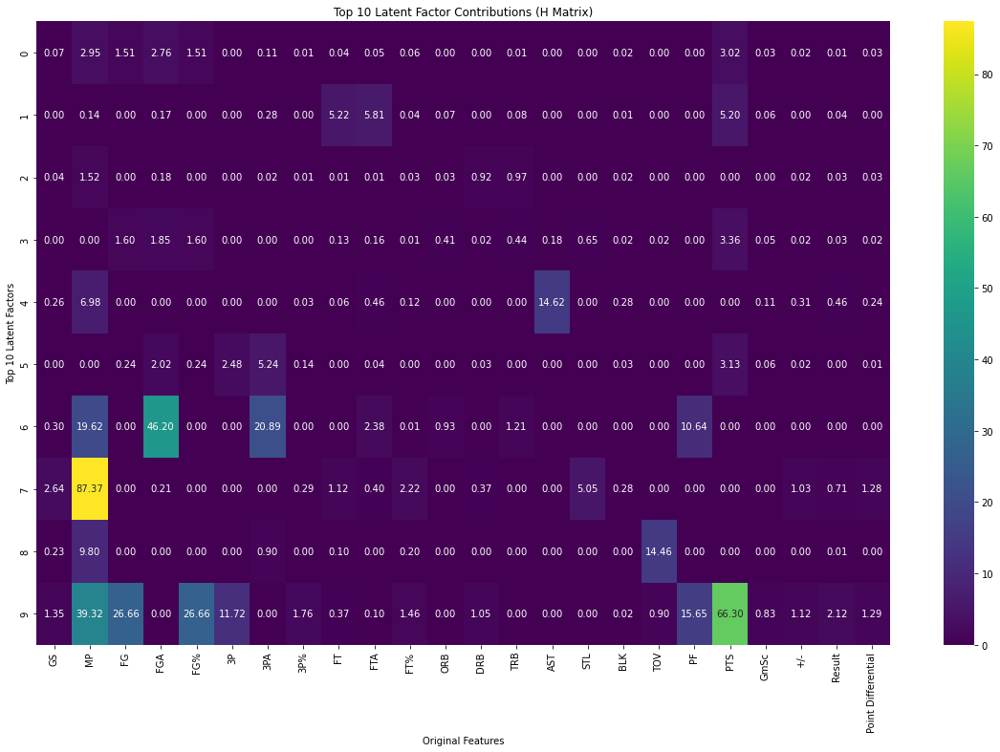

In [247]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import NMF
import time

# Load dataset (update to match your dataset)
X = data.drop(columns=['Tm', 'Opp', 'Date', 'G', 'Rk', 'Age']).dropna()
print(len(X))

# Parameters
n_components = 10  # Total number of latent factors
top_components = 10  # Number of top components to display in the heatmap
algorithms = ['cd']

results = {}

for algo in algorithms:
    print(f"Running NMF with {algo} algorithm...")
    
    # Measure time
    start_time = time.time()
    
    # Initialize NMF model
    model = NMF(n_components=n_components, solver=algo, init='random', max_iter=500, random_state=42)
    
    # Fit the model
    W = model.fit_transform(X)
    H = model.components_
    
    # Compute reconstruction error
    reconstruction_error = model.reconstruction_err_
    elapsed_time = time.time() - start_time
    
    # Store results
    results[algo] = {
        'reconstruction_error': reconstruction_error,
        'elapsed_time': elapsed_time
    }
    print(f"Algorithm: {algo}, Reconstruction Error: {reconstruction_error:.4f}, Time: {elapsed_time:.4f}s")

# Prepare DataFrame for the heatmap
H_df = pd.DataFrame(H[:top_components], columns=X.columns)  # Select top 10 components

# Plot heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(H_df, annot=True, cmap='viridis', fmt=".2f")
plt.title("Top 10 Latent Factor Contributions (H Matrix)")
plt.xlabel("Original Features")
plt.ylabel("Top 10 Latent Factors")
plt.show()


Running NMF with mu algorithm, random init, 25 components...
Running NMF with mu algorithm, random init, 50 components...
Running NMF with mu algorithm, random init, 75 components...
Running NMF with mu algorithm, random init, 100 components...
Running NMF with mu algorithm, random init, 125 components...
Running NMF with mu algorithm, random init, 150 components...
Running NMF with mu algorithm, random init, 175 components...
Running NMF with mu algorithm, random init, 200 components...
Running NMF with cd algorithm, random init, 25 components...
Running NMF with cd algorithm, random init, 50 components...
Running NMF with cd algorithm, random init, 75 components...
Running NMF with cd algorithm, random init, 100 components...
Running NMF with cd algorithm, random init, 125 components...
Running NMF with cd algorithm, random init, 150 components...
Running NMF with cd algorithm, random init, 175 components...
Running NMF with cd algorithm, random init, 200 components...


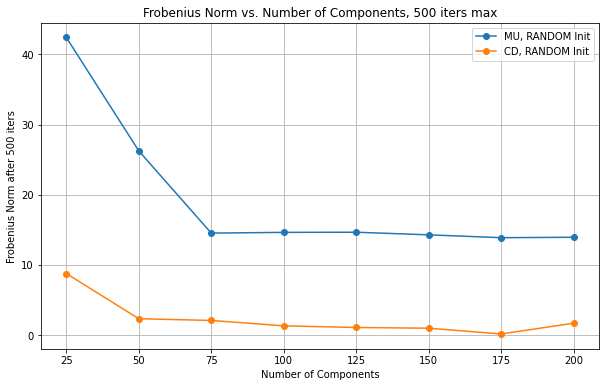

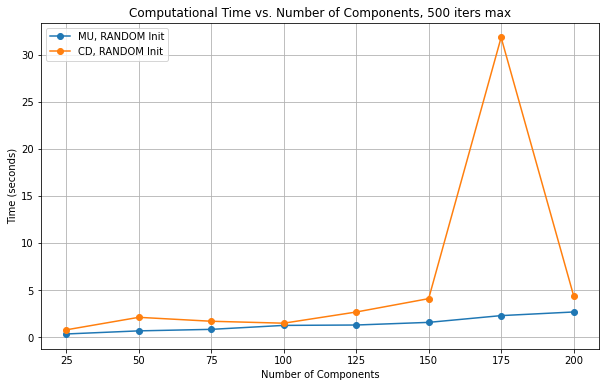

In [246]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import NMF
from sklearn.preprocessing import StandardScaler
import time

# Simulate a larger dataset
X_scaled = X.append(X, ignore_index=True)

# Parameters
n_samples, n_features = X_scaled.shape
n_components_list = [25, 50, 75, 100, 125, 150, 175, 200]  # Number of components to test
init_methods = ['random']
algorithms = ['mu', 'cd']
max_iter = 500

# Results dictionary
results = []

for init in init_methods:
    for algo in algorithms:
        for n_components in n_components_list:
            print(f"Running NMF with {algo} algorithm, {init} init, {n_components} components...")
            
            # Initialize and fit NMF model
            try:
                start_time = time.time()
                model = NMF(n_components=n_components, solver=algo, init=init, max_iter=max_iter, random_state=42)
                W = model.fit_transform(X_scaled)
                H = model.components_
                elapsed_time = time.time() - start_time
                
                # Compute Frobenius norm (reconstruction error)
                frobenius_norm = model.reconstruction_err_
                
                # Store results
                results.append({
                    'algorithm': algo,
                    'init': init,
                    'n_components': n_components,
                    'frobenius_norm': frobenius_norm,
                    'elapsed_time': elapsed_time
                })
            except Exception as e:
                print(f"Error with {algo}, {init}, {n_components}: {e}")

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Plot Frobenius Norm vs. Number of Components
plt.figure(figsize=(10, 6))
for init in init_methods:
    for algo in algorithms:
        subset = results_df[(results_df['init'] == init) & (results_df['algorithm'] == algo)]
        label = f"{algo.upper()}, {init.upper()} Init"
        plt.plot(subset['n_components'], subset['frobenius_norm'], marker='o', label=label)

plt.title("Frobenius Norm vs. Number of Components, 500 iters max")
plt.xlabel("Number of Components")
plt.ylabel("Frobenius Norm after 500 iters")
plt.legend()
plt.grid()
plt.show()

# Plot Computational Time vs. Number of Components
plt.figure(figsize=(10, 6))
for init in init_methods:
    for algo in algorithms:
        subset = results_df[(results_df['init'] == init) & (results_df['algorithm'] == algo)]
        label = f"{algo.upper()}, {init.upper()} Init"
        plt.plot(subset['n_components'], subset['elapsed_time'], marker='o', label=label)

plt.title("Computational Time vs. Number of Components, 500 iters max")
plt.xlabel("Number of Components")
plt.ylabel("Time (seconds)")
plt.legend()
plt.grid()
plt.show()


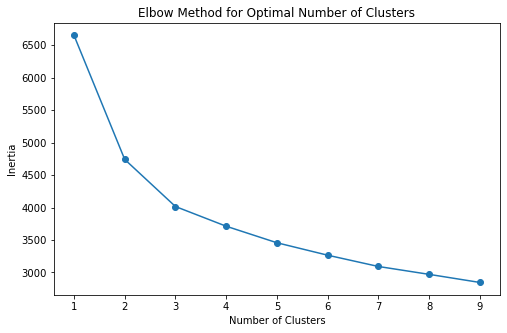

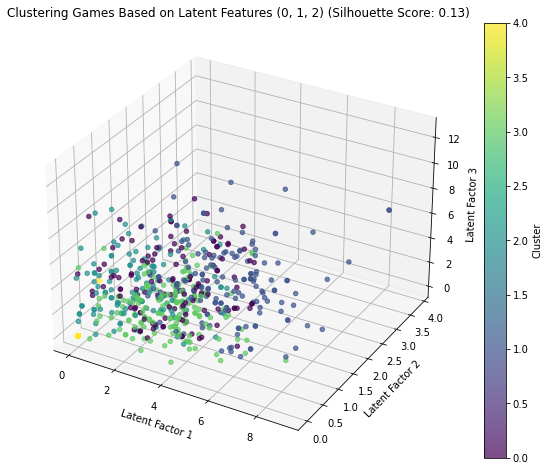

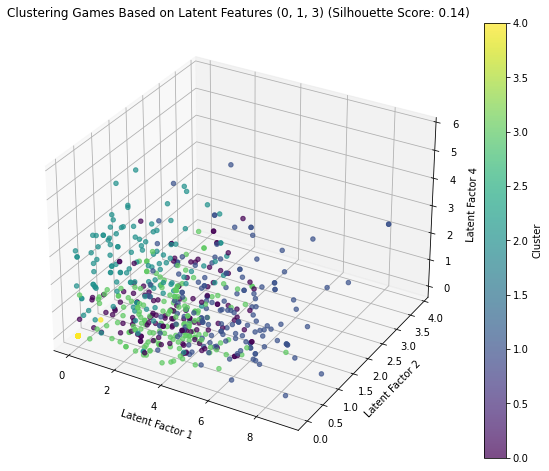

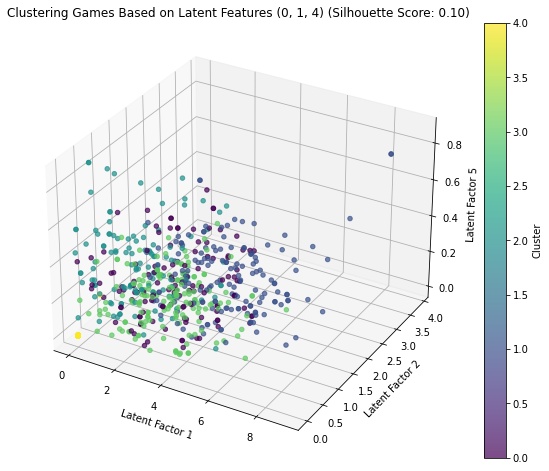

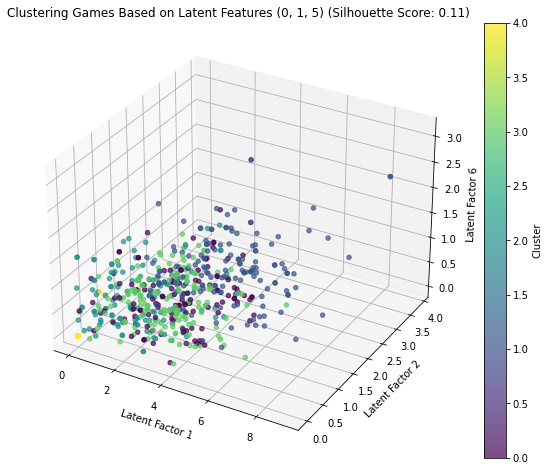

...

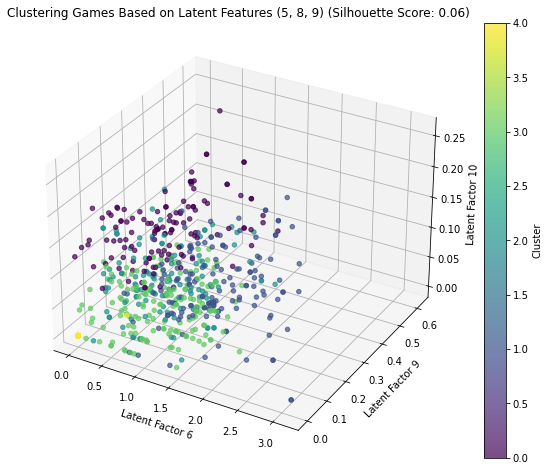

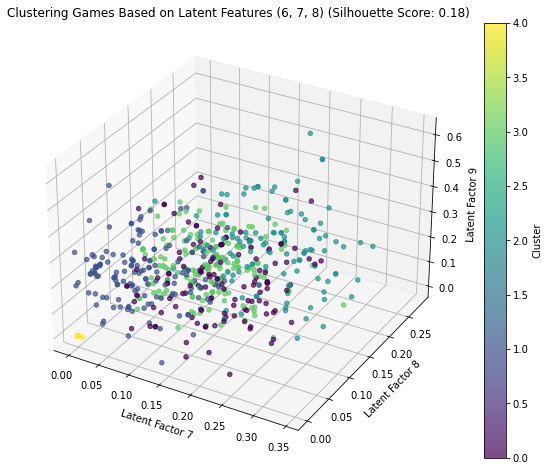

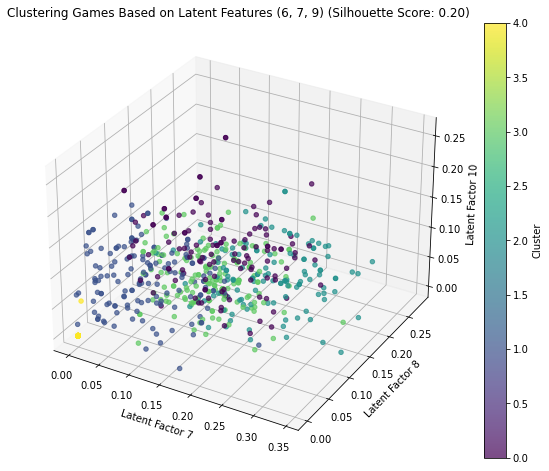

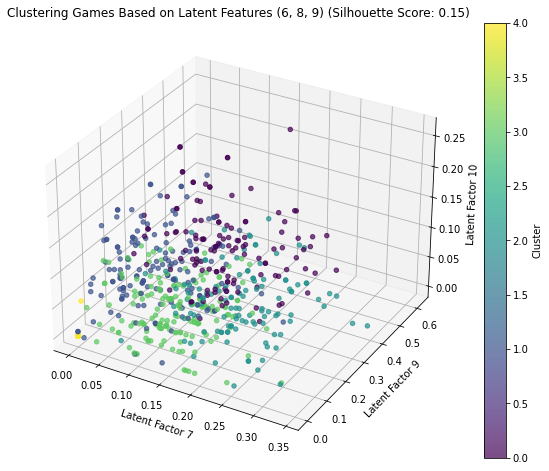

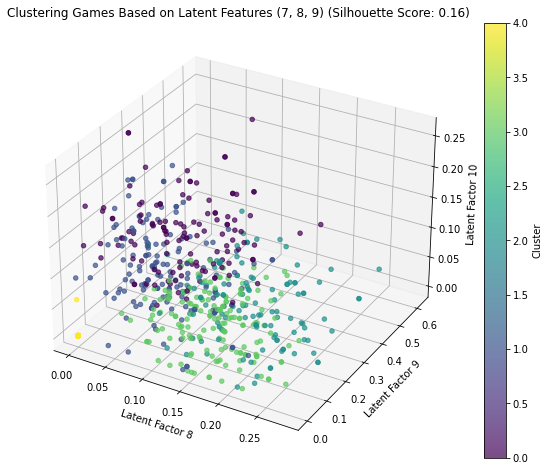

Best triplet of latent factors: (6, 7, 9) with Silhouette Score: 0.20


In [248]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from itertools import combinations
from sklearn.metrics import silhouette_score
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Normalize the W matrix
scaler = StandardScaler()
W_normalized = scaler.fit_transform(W)  # W is the latent feature matrix

# Perform K-Means clustering
n_clusters = 5  # Choose the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(W_normalized)

# Add cluster labels to a DataFrame for easier analysis
games_df = pd.DataFrame(W, columns=[f"Latent Factor {i+1}" for i in range(W.shape[1])])
games_df['Cluster'] = clusters

# Determine the optimal number of clusters using the elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(W_normalized)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(range(1, 10), inertia, marker='o')
plt.title("Elbow Method for Optimal Number of Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()

# Function to iterate over all combinations of latent features for 3D visualization
best_score = -1
best_triplet = None
results = []

# Iterate over all unique triplets of latent factors
for triplet in combinations(range(W.shape[1]), 3):  # W.shape[1] is the number of latent factors
    x_idx, y_idx, z_idx = triplet

    # Calculate silhouette score for the triplet
    silhouette_avg = silhouette_score(W[:, [x_idx, y_idx, z_idx]], clusters)
    
    # Store results
    results.append((triplet, silhouette_avg))
    
    # Update best triplet
    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_triplet = triplet

    # Plot the clusters for the current triplet in 3D
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(W[:, x_idx], W[:, y_idx], W[:, z_idx], c=clusters, cmap='viridis', alpha=0.7)
    ax.set_title(f"Clustering Games Based on Latent Features {triplet} (Silhouette Score: {silhouette_avg:.2f})")
    ax.set_xlabel(f"Latent Factor {x_idx + 1}")
    ax.set_ylabel(f"Latent Factor {y_idx + 1}")
    ax.set_zlabel(f"Latent Factor {z_idx + 1}")
    fig.colorbar(scatter, label="Cluster")
    plt.show()

# Print the best triplet of features
print(f"Best triplet of latent factors: {best_triplet} with Silhouette Score: {best_score:.2f}")


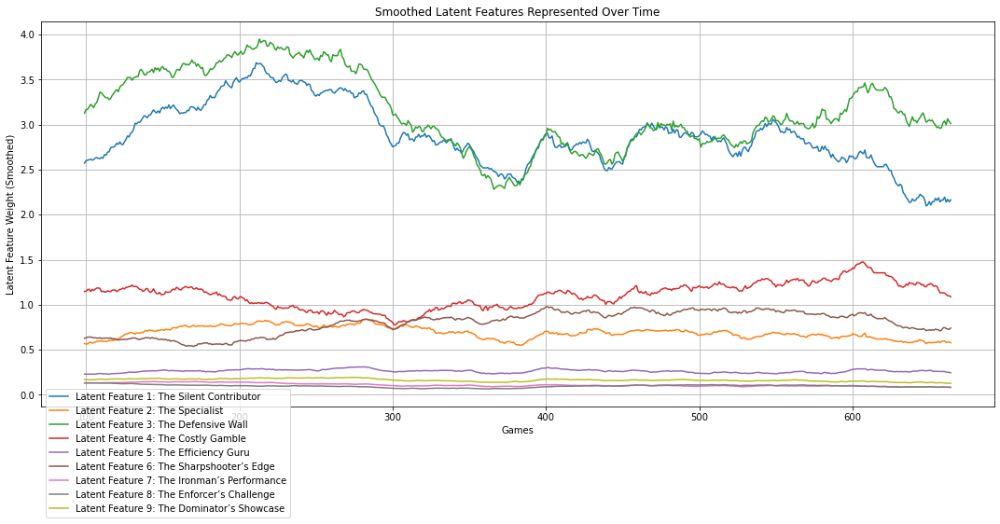

In [251]:
import pandas as pd
import matplotlib.pyplot as plt

# Example: Assuming W is the latent feature matrix (games x latent features)
game_dates = pd.date_range(start="2017-10-01", periods=W.shape[0], freq="D")  # Example dates

# Create a DataFrame for selected latent features with time
selected_features = range(1, 10)  # Features to plot
latent_features_df = pd.DataFrame(W[:, [f - 1 for f in selected_features]],  # Adjust for zero-based indexing
                                  columns=[
                                      "Latent Feature 1: The Silent Contributor",
                                      "Latent Feature 2: The Specialist",
                                      "Latent Feature 3: The Defensive Wall",
                                      "Latent Feature 4: The Costly Gamble",
                                      "Latent Feature 5: The Efficiency Guru",
                                      "Latent Feature 6: The Sharpshooter’s Edge",
                                      "Latent Feature 7: The Ironman’s Performance",
                                      "Latent Feature 8: The Enforcer’s Challenge",
                                      "Latent Feature 9: The Dominator’s Showcase",
                                  ])
latent_features_df['Date'] = game_dates

# Convert dates to datetime if they are not already
latent_features_df['Date'] = pd.to_datetime(latent_features_df['Date'])

# Apply a rolling average to smooth the data
window_size = 100  # Set the window size (e.g., 7 for weekly smoothing)
smoothed_df = latent_features_df.set_index('Date').rolling(window=window_size).mean().reset_index()

# Plot smoothed latent features over time
plt.figure(figsize=(15, 8))
for feature in smoothed_df.columns[1:]:  # Exclude the "Date" column
    plt.plot(smoothed_df[feature], label=feature)

plt.title("Smoothed Latent Features Represented Over Time")
plt.xlabel("Games")
plt.ylabel("Latent Feature Weight (Smoothed)")

# Position the legend at the bottom left
plt.legend(loc="lower left", bbox_to_anchor=(0, -0.3), ncol=1, fontsize=10)
plt.grid(True)

# Adjust layout for better spacing
plt.tight_layout()

plt.show()
